<a href="https://colab.research.google.com/github/jh-4166640/Machine-Learning-Lecture/blob/main/CatDogClassification_RCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install tensorflow
!pip install keras
!pip install numpy
!pip install matplotlib
!pip install pandas
!pip install os
!pip install cv2



ERROR: Could not find a version that satisfies the requirement os (from versions: none)
ERROR: No matching distribution found for os
ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2


In [2]:
from tensorflow import keras
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import cv2
import random


In [5]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mahdinavaei/cat-and-dog-classifier")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'cat-and-dog-classifier' dataset.
Path to dataset files: /kaggle/input/cat-and-dog-classifier


In [8]:
# Download latest version
path = kagglehub.dataset_download("prasunroy/natural-images")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'natural-images' dataset.
Path to dataset files: /kaggle/input/natural-images


In [55]:
!rm -r /content/my_data/

In [89]:
use_test_ds = 0
use_extra_image = 1

TEST_IMG = use_test_ds

import shutil
kaggle_data_path = "/kaggle/input/cat-and-dog-classifier/data"
other_data_path = "/kaggle/input/natural-images/natural_images"
target_path = "/content/my_data"
test_path = "/content/my_test_data"


os.makedirs(os.path.join(target_path, "Cat"), exist_ok=True)
os.makedirs(os.path.join(target_path, "Dog"), exist_ok=True)
os.makedirs(os.path.join(target_path, "Other"), exist_ok=True)
os.makedirs(test_path, exist_ok=True)

# 기존 Cat, Dog 이미지 복사
for label in ["Cat", "Dog"]:
    src_folder = os.path.join(kaggle_data_path, label)
    dst_folder = os.path.join(target_path, label)
    for file in os.listdir(src_folder):
        if file.endswith(".jpg"):
            shutil.copy(os.path.join(src_folder, file), os.path.join(dst_folder, file))
"""
for label_o in ["airplane", "flower", "person","car"]:
  src_folder = os.path.join(other_data_path, label_o)
  dst_folder = os.path.join(target_path, "Other")
  for file in os.listdir(src_folder):
      if file.endswith(".jpg"):
          shutil.copy(os.path.join(src_folder, file), os.path.join(dst_folder, file))
"""
for label_o in ["airplane", "flower", "person", "car"]:
    src_folder = os.path.join(other_data_path, label_o)
    dst_folder = os.path.join(target_path, "Other")

    files = [f for f in os.listdir(src_folder) if f.lower().endswith(".jpg")]

    if len(files) < 40:
        print(f"[경고] {label_o} 폴더에 이미지가 {len(files)}장밖에 없습니다. 전부 복사합니다.")
        selected_files = files
    else:
        selected_files = random.sample(files, 40)

    for file in selected_files:
        src = os.path.join(src_folder, file)
        dst = os.path.join(dst_folder, f"{label_o}_{file}")
        shutil.copy(src, dst)

if TEST_IMG:
  # 전혀 다른 이미지 셋
  for label_t in ["cat", "dog"]:
      src_folder = os.path.join(other_data_path, label_t)
      dst_folder = test_path
      for file in os.listdir(src_folder):
          if file.endswith(".jpg"):
              shutil.copy(os.path.join(src_folder, file), os.path.join(dst_folder, file))


['Cat', 'Dog', 'Other']
Found 1387 files belonging to 3 classes.
전체 배치 수: 44
train batch 개수: -2
test batch 개수: 9


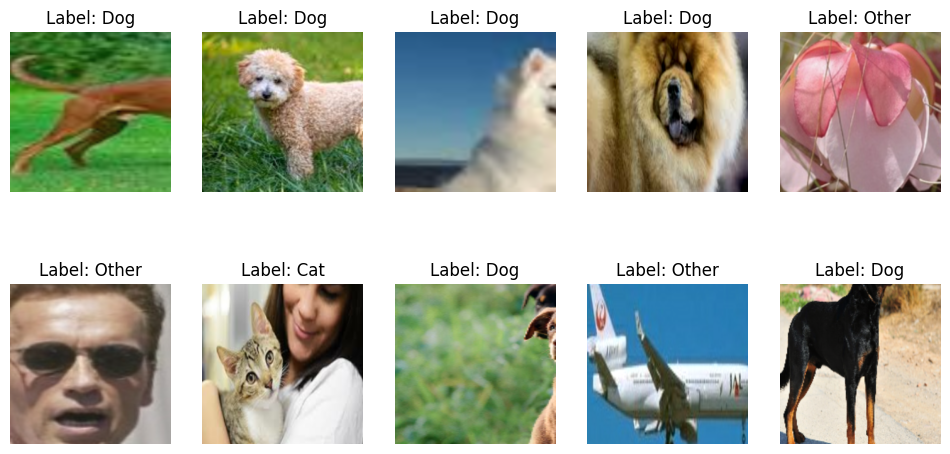

In [238]:
dir ="/content/my_data"
class_names = sorted(os.listdir(dir))  # 폴더명을 알파벳 순서로 정렬
print(class_names)
full_ds = keras.utils.image_dataset_from_directory(
    dir,
    labels="inferred",
    label_mode="int",       # 분류 결과를 정수로
    color_mode="rgb",
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=777,
)
dataset_size = tf.data.experimental.cardinality(full_ds).numpy()
print("전체 배치 수:", dataset_size)


train_size = int(0.8 * dataset_size)

train_ds = full_ds.take(train_size)
test_ds  = full_ds.skip(train_size)

def strong_augment(image, label):
    """더 다양한 crop 시뮬레이션"""

    # 1. 랜덤 crop (다양한 비율)
    crop_type = tf.random.uniform([], 0, 3, dtype=tf.int32)

    if crop_type == 0:  # 정사각형
        crop_ratio = tf.random.uniform([], 0.7, 1.0)  # 0.6~0.9 → 0.7~1.0으로 완화
        crop_h = crop_w = crop_ratio
    elif crop_type == 1:  # 가로로 긴
        crop_w = tf.random.uniform([], 0.6, 0.9)
        crop_h = crop_w * tf.random.uniform([], 0.5, 0.8)
    else:  # 세로로 긴
        crop_h = tf.random.uniform([], 0.6, 0.9)
        crop_w = crop_h * tf.random.uniform([], 0.5, 0.8)

    shape = tf.shape(image)
    height = tf.cast(shape[0], tf.float32)
    width = tf.cast(shape[1], tf.float32)

    crop_height = tf.cast(height * crop_h, tf.int32)
    crop_width = tf.cast(width * crop_w, tf.int32)

    image = tf.image.random_crop(image, [crop_height, crop_width, 3])
    image = tf.image.resize(image, [256, 256])

    # 2. 추가 증강
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_brightness(image, 0.05)
    image = tf.image.random_contrast(image, 0.9, 1.1)


    return image, label

train_ds = train_ds.unbatch()
train_ds = train_ds.map(strong_augment, num_parallel_calls=tf.data.AUTOTUNE)  # 증강
train_ds = train_ds.batch(32)
train_ds = train_ds.map(lambda x, y: (x / 255.0, y))
test_ds  = test_ds.map(lambda x, y: (x / 255.0, y))


print("train batch 개수:", tf.data.experimental.cardinality(train_ds).numpy())
print("test batch 개수:", tf.data.experimental.cardinality(test_ds).numpy())

for images, labels in train_ds.take(1):
    plt.figure(figsize=(12, 6))
    for i in range(10):  # 5개만 시각화
        ax = plt.subplot(2, 5, i + 1)
        plt.imshow(images[i].numpy())
        plt.title(f"Label: {class_names[labels[i].numpy()]}")
        plt.axis("off")
    plt.show()


In [222]:
my_lr = 0.001
my_momentum = 0.9
my_beta = 0.999


optimizer= keras.optimizers.Adam(learning_rate=my_lr,beta_1 = my_momentum,beta_2 =my_beta)
#optimizer= keras.optimizers.SGD(learning_rate=my_lr,momentum=my_momentum)
# 손실 함수는 다중 클래스용
loss = keras.losses.SparseCategoricalCrossentropy()  # 정수 레이블용
metrics = ["accuracy"]

# 2층 CNN
model = keras.models.Sequential([
    keras.layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    keras.layers.MaxPooling2D((2,2)),
    keras.layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    keras.layers.MaxPooling2D((2,2)),
    keras.layers.Conv2D(128, (3,3), activation='relu', padding='same'),
    keras.layers.MaxPooling2D((2,2)),
    keras.layers.Flatten(),
    keras.layers.Dropout(0.25),
    keras.layers.Dense(128, activation="relu"),
    keras.layers.Dense(64, activation="relu"),
    keras.layers.Dropout(0.25),
    keras.layers.Dense(3, activation="softmax")
])

model.compile(optimizer=optimizer, loss=loss, metrics=metrics)


In [223]:
epoch = 300

checkpoint_cb = keras.callbacks.ModelCheckpoint(
    "best_model.h5",
    save_best_only=True,        # validation_loss 기준 최적 모델만 저장
    monitor="val_loss",
    mode="min"
)
earlystop_cb = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,       # 10 Epoch 동안 개선 없으면 종료
    restore_best_weights=True  # 종료 시 최적 가중치 복원
)

history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=epoch,
    callbacks=[checkpoint_cb, earlystop_cb]
)

"""
history = model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=epoch
)
"""


Epoch 1/300
     31/Unknown 7s 51ms/step - accuracy: 0.3957 - loss: 1.3239

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


31/31 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - accuracy: 0.3964 - loss: 1.3176 - val_accuracy: 0.4618 - val_loss: 0.9813
Epoch 2/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.4358 - loss: 0.9764

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - accuracy: 0.4364 - loss: 0.9763 - val_accuracy: 0.4659 - val_loss: 0.9750
Epoch 3/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.4784 - loss: 0.9850

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.4788 - loss: 0.9840 - val_accuracy: 0.4900 - val_loss: 0.9410
Epoch 4/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.5188 - loss: 0.9157

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - accuracy: 0.5183 - loss: 0.9157 - val_accuracy: 0.5703 - val_loss: 0.9203
Epoch 5/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.5403 - loss: 0.8988

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - accuracy: 0.5393 - loss: 0.8994 - val_accuracy: 0.5984 - val_loss: 0.8521
Epoch 6/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.5202 - loss: 0.9230

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - accuracy: 0.5200 - loss: 0.9228 - val_accuracy: 0.5703 - val_loss: 0.8377
Epoch 7/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.5321 - loss: 0.9076

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.5328 - loss: 0.9070 - val_accuracy: 0.6627 - val_loss: 0.7856
Epoch 8/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.5449 - loss: 0.8948 - val_accuracy: 0.6104 - val_loss: 0.8625
Epoch 9/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.5333 - loss: 0.8817 - val_accuracy: 0.5783 - val_loss: 0.8201
Epoch 10/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.5432 - loss: 0.8613 - val_accuracy: 0.5904 - val_loss: 0.8369
Epoch 11/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - accuracy: 0.5761 - loss: 0.8696 - val_accuracy: 0.5582 - val_loss: 0.8418
Epoch 12/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.5495 - loss: 0.8492

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - accuracy: 0.5502 - loss: 0.8490 - val_accuracy: 0.6787 - val_loss: 0.7707
Epoch 13/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.5986 - loss: 0.8122 - val_accuracy: 0.6305 - val_loss: 0.7828
Epoch 14/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.5951 - loss: 0.8289

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - accuracy: 0.5946 - loss: 0.8287 - val_accuracy: 0.6466 - val_loss: 0.7504
Epoch 15/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.6278 - loss: 0.7788

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - accuracy: 0.6276 - loss: 0.7792 - val_accuracy: 0.6466 - val_loss: 0.7287
Epoch 16/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.5639 - loss: 0.8549 - val_accuracy: 0.6145 - val_loss: 0.7684
Epoch 17/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.5923 - loss: 0.8126

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.5923 - loss: 0.8127 - val_accuracy: 0.6707 - val_loss: 0.7231
Epoch 18/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - accuracy: 0.6272 - loss: 0.8112 - val_accuracy: 0.6586 - val_loss: 0.7403
Epoch 19/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.5853 - loss: 0.8354

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - accuracy: 0.5855 - loss: 0.8348 - val_accuracy: 0.6747 - val_loss: 0.6832
Epoch 20/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.5938 - loss: 0.7900 - val_accuracy: 0.5904 - val_loss: 0.7668
Epoch 21/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.6211 - loss: 0.7961 - val_accuracy: 0.6305 - val_loss: 0.7204
Epoch 22/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.6591 - loss: 0.7620

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - accuracy: 0.6590 - loss: 0.7620 - val_accuracy: 0.7108 - val_loss: 0.6428
Epoch 23/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - accuracy: 0.6207 - loss: 0.8160 - val_accuracy: 0.6466 - val_loss: 0.7081
Epoch 24/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.6520 - loss: 0.7299

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.6517 - loss: 0.7301 - val_accuracy: 0.7229 - val_loss: 0.5928
Epoch 25/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - accuracy: 0.6400 - loss: 0.7492 - val_accuracy: 0.7309 - val_loss: 0.6085
Epoch 26/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.6531 - loss: 0.7134 - val_accuracy: 0.7550 - val_loss: 0.6196
Epoch 27/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - accuracy: 0.6635 - loss: 0.7343 - val_accuracy: 0.6787 - val_loss: 0.6345
Epoch 28/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - accuracy: 0.6524 - loss: 0.7471 - val_accuracy: 0.6827 - val_loss: 0.6763
Epoch 29/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - accuracy: 0.6860 - loss: 0.7055 - val_accuracy: 0.7430 - val_loss: 0.6014
Epoch 30/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.6910 - loss: 0.7027 - val_accuracy: 0.6747 - val_loss: 0.6543
Epoch 31/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.6785 - loss: 0.7063 - val_accuracy: 0.7189

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - accuracy: 0.6861 - loss: 0.6920 - val_accuracy: 0.7550 - val_loss: 0.5821
Epoch 33/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6563 - loss: 0.7491

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - accuracy: 0.6564 - loss: 0.7485 - val_accuracy: 0.7711 - val_loss: 0.5693
Epoch 34/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.7023 - loss: 0.6662

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.7017 - loss: 0.6669 - val_accuracy: 0.7751 - val_loss: 0.5674
Epoch 35/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.6844 - loss: 0.6971 - val_accuracy: 0.6948 - val_loss: 0.6293
Epoch 36/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - accuracy: 0.6706 - loss: 0.6887 - val_accuracy: 0.7028 - val_loss: 0.6135
Epoch 37/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.7078 - loss: 0.6755 - val_accuracy: 0.6948 - val_loss: 0.6347
Epoch 38/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - accuracy: 0.6921 - loss: 0.6787 - val_accuracy: 0.7711 - val_loss: 0.5680
Epoch 39/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - accuracy: 0.7059 - loss: 0.6539 - val_accuracy: 0.7189 - val_loss: 0.5688
Epoch 40/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.6838 - loss: 0.7003

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - accuracy: 0.6843 - loss: 0.6995 - val_accuracy: 0.8233 - val_loss: 0.4852
Epoch 41/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.6879 - loss: 0.6663 - val_accuracy: 0.7068 - val_loss: 0.6000
Epoch 42/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.6728 - loss: 0.6684 - val_accuracy: 0.7550 - val_loss: 0.5828
Epoch 43/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.7160 - loss: 0.6327 - val_accuracy: 0.7229 - val_loss: 0.5871
Epoch 44/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.6946 - loss: 0.6632 - val_accuracy: 0.7108 - val_loss: 0.6071
Epoch 45/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.7072 - loss: 0.6272 - val_accuracy: 0.7390 - val_loss: 0.5786
Epoch 46/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.7354 - loss: 0.6023 - val_accuracy: 0.7390 - val_loss: 0.5666
Epoch 47/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - accuracy: 0.7129 - loss: 0.6326 - val_accuracy: 0.7751

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - accuracy: 0.7137 - loss: 0.6450 - val_accuracy: 0.8072 - val_loss: 0.4625
Epoch 49/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - accuracy: 0.7457 - loss: 0.5883 - val_accuracy: 0.7831 - val_loss: 0.5520
Epoch 50/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.7336 - loss: 0.6173 - val_accuracy: 0.7952 - val_loss: 0.5132
Epoch 51/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - accuracy: 0.7633 - loss: 0.5660 - val_accuracy: 0.7912 - val_loss: 0.4816
Epoch 52/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.7238 - loss: 0.6246 - val_accuracy: 0.7671 - val_loss: 0.5599
Epoch 53/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.7192 - loss: 0.5989 - val_accuracy: 0.7831 - val_loss: 0.4859
Epoch 54/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - accuracy: 0.7679 - loss: 0.5613 - val_accuracy: 0.7671 - val_loss: 0.5227
Epoch 55/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7213 - loss: 0.6918

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - accuracy: 0.7213 - loss: 0.6904 - val_accuracy: 0.8233 - val_loss: 0.4497
Epoch 56/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - accuracy: 0.7347 - loss: 0.5640 - val_accuracy: 0.7751 - val_loss: 0.4796
Epoch 57/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - accuracy: 0.7130 - loss: 0.6079 - val_accuracy: 0.7631 - val_loss: 0.5431
Epoch 58/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - accuracy: 0.7295 - loss: 0.5664 - val_accuracy: 0.7992 - val_loss: 0.4758
Epoch 59/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.7588 - loss: 0.5391 - val_accuracy: 0.7912 - val_loss: 0.5012
Epoch 60/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.7551 - loss: 0.5535

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - accuracy: 0.7552 - loss: 0.5539 - val_accuracy: 0.7952 - val_loss: 0.4342
Epoch 61/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.7782 - loss: 0.5231 - val_accuracy: 0.8233 - val_loss: 0.4376
Epoch 62/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.7559 - loss: 0.5631

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.7553 - loss: 0.5638 - val_accuracy: 0.8394 - val_loss: 0.4089
Epoch 63/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - accuracy: 0.7393 - loss: 0.5713 - val_accuracy: 0.8112 - val_loss: 0.4807
Epoch 64/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.7529 - loss: 0.5900 - val_accuracy: 0.7871 - val_loss: 0.4825
Epoch 65/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.7303 - loss: 0.6060 - val_accuracy: 0.7791 - val_loss: 0.4776
Epoch 66/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.7445 - loss: 0.6133 - val_accuracy: 0.8153 - val_loss: 0.4144
Epoch 67/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - accuracy: 0.7835 - loss: 0.5399 - val_accuracy: 0.8193 - val_loss: 0.4451
Epoch 68/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.7792 - loss: 0.5237 - val_accuracy: 0.8153 - val_loss: 0.4231
Epoch 69/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.7365 - loss: 0.5687

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - accuracy: 0.7370 - loss: 0.5679 - val_accuracy: 0.8313 - val_loss: 0.3989
Epoch 70/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.7713 - loss: 0.5355 - val_accuracy: 0.8474 - val_loss: 0.4237
Epoch 71/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.7897 - loss: 0.4945

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - accuracy: 0.7895 - loss: 0.4952 - val_accuracy: 0.8474 - val_loss: 0.3396
Epoch 72/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.7378 - loss: 0.5512 - val_accuracy: 0.8153 - val_loss: 0.3960
Epoch 73/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - accuracy: 0.7762 - loss: 0.5062 - val_accuracy: 0.8353 - val_loss: 0.4153
Epoch 74/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - accuracy: 0.7842 - loss: 0.5102 - val_accuracy: 0.8474 - val_loss: 0.3578
Epoch 75/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - accuracy: 0.7915 - loss: 0.4838 - val_accuracy: 0.8715 - val_loss: 0.3439
Epoch 76/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - accuracy: 0.7815 - loss: 0.5077 - val_accuracy: 0.8353 - val_loss: 0.3462
Epoch 77/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.8036 - loss: 0.4881

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - accuracy: 0.8033 - loss: 0.4883 - val_accuracy: 0.8795 - val_loss: 0.3022
Epoch 78/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.7656 - loss: 0.5180 - val_accuracy: 0.8353 - val_loss: 0.4002
Epoch 79/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.7712 - loss: 0.5268 - val_accuracy: 0.8876 - val_loss: 0.3353
Epoch 80/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 18s 579ms/step - accuracy: 0.7584 - loss: 0.5344 - val_accuracy: 0.8193 - val_loss: 0.4096
Epoch 81/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.7815 - loss: 0.4762 - val_accuracy: 0.8394 - val_loss: 0.3778
Epoch 82/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.7875 - loss: 0.4822

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - accuracy: 0.7869 - loss: 0.4831 - val_accuracy: 0.8795 - val_loss: 0.2917
Epoch 83/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - accuracy: 0.7593 - loss: 0.5274 - val_accuracy: 0.8514 - val_loss: 0.3785
Epoch 84/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.7849 - loss: 0.4948 - val_accuracy: 0.8594 - val_loss: 0.3369
Epoch 85/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.8019 - loss: 0.4580 - val_accuracy: 0.8675 - val_loss: 0.3251
Epoch 86/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.8039 - loss: 0.4552

31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - accuracy: 0.8036 - loss: 0.4555 - val_accuracy: 0.8996 - val_loss: 0.2534
Epoch 87/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.7924 - loss: 0.4729 - val_accuracy: 0.8474 - val_loss: 0.3460
Epoch 88/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.7981 - loss: 0.4485 - val_accuracy: 0.8675 - val_loss: 0.2970
Epoch 89/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.8124 - loss: 0.4863 - val_accuracy: 0.8715 - val_loss: 0.2862
Epoch 90/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.8191 - loss: 0.4267 - val_accuracy: 0.8996 - val_loss: 0.2692
Epoch 91/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - accuracy: 0.7633 - loss: 0.5394 - val_accuracy: 0.8635 - val_loss: 0.3128
Epoch 92/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.7874 - loss: 0.4835 - val_accuracy: 0.8956 - val_loss: 0.3025
Epoch 93/300
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - accuracy: 0.7983 - loss: 0.4712 - val_accuracy: 0.8675 

'\nhistory = model.fit(\n    train_ds,\n    validation_data=test_ds,\n    epochs=epoch\n)\n'

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 1. 모델 예측
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    y_pred.extend((preds > 0.5).astype(int).flatten())  # 0/1 변환
    y_true.extend(labels.numpy())
    #print(y_pred, y_true)

y_true = np.array(y_true).flatten()
y_pred = np.array(y_pred).flatten()

# 2. 틀린 인덱스 추출
wrong_idx = np.where(y_true != y_pred)[0]
print(np.unique(wrong_idx))
y_wrong = y_true[wrong_idx]
print(np.unique(y_wrong))

test_images_list = list(test_ds.unbatch())

num_images = len(wrong_idx)
print(f"틀린 이미지 개수: {num_images}")


plt.figure(figsize=(12,12))
for i, idx in enumerate(wrong_idx[:16]):
    img, label = test_images_list[idx]
    img = (img.numpy() * 255).astype("uint8")
    plt.subplot(4,4,i+1)
    plt.imshow(img)
    plt.title(f"True: {class_names[y_true[idx].astype("uint8")]}, Pred: {class_names[y_pred[idx].astype("uint8")]}")
    plt.axis("off")
plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


ValueError: operands could not be broadcast together with shapes (568,) (1704,) 

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylim(0,1)
plt.grid(True)
plt.gca().set_ylim(0.001)
plt.title("Conv2D-MaxPooling2D of 2 layer\nstride=(7,7), padding=valid",fontsize=22)
plt.xlabel('Epochs',fontsize=18)
xticks = np.arange(0,epoch+1,1)
plt.xticks(xticks,fontsize=12)
plt.show()


In [ ]:
# GPT fiter 수에 따른 feature map 차이
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

for images, labels in train_ds.take(1):
    first_image = images[0]
input_img = tf.expand_dims(first_image, axis=0)

filters_list = [4, 8, 32, 64]
kernel_size = (3,3)

for num_filters in filters_list:
    model = keras.models.Sequential([
        keras.layers.Conv2D(num_filters, kernel_size, activation='relu', input_shape=(256,256,3))
    ])

    feature_maps = model.predict(input_img)
    print(f"Filters: {num_filters}, Feature map shape: {feature_maps.shape}")

    max_cols = 8
    n_rows = (num_filters + max_cols - 1) // max_cols
    n_cols = min(num_filters, max_cols)

    plt.figure(figsize=(n_cols*2, n_rows*2))
    for i in range(num_filters):
        plt.subplot(n_rows, n_cols, i+1)
        plt.imshow(feature_maps[0,:,:,i], cmap='viridis')
        plt.axis('off')
        plt.title(f'F{i+1}', fontsize=8)
    plt.suptitle(f'Num of filters = {num_filters}', fontsize=12)
    plt.tight_layout()
    plt.show()


R-CNN 동작

In [15]:
!pip install selectivesearch

  Preparing metadata (setup.py) ... done
  Created wheel for selectivesearch: filename=selectivesearch-0.4-py3-none-any.whl size=4336 sha256=6c7ca68c7329b25f43877672c57432a37d671d75a853be7742bcf6db53bda7cf
  Stored in directory: /root/.cache/pip/wheels/7f/9b/c7/58b71f1e9fe4aa0ef8affd1c673f8818bc22a5091ea8cbbe93
Successfully built selectivesearch


In [90]:
img_list = []

if TEST_IMG:
  # 전혀 다른 dataset의
  test_dir = "/content/my_test_data"
  for fname in os.listdir(test_dir):
      full_path = os.path.join(test_dir, fname)
      img_list.append(full_path)

  CNN_model = keras.models.load_model('best_model.h5')
else:
  for images, labels in test_ds:
    for img in images:
        img_list.append(img.numpy())  # 텐서를 numpy로 변환


In [142]:
def iou(boxA, boxB):
    # box = [xmin, ymin, xmax, ymax]
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interWidth = max(0, xB - xA)
    interHeight = max(0, yB - yA)
    interArea = interWidth * interHeight

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

def merge_boxes(boxA, boxB):
    xmin = min(boxA[0], boxB[0])
    ymin = min(boxA[1], boxB[1])
    xmax = max(boxA[2], boxB[2])
    ymax = max(boxA[3], boxB[3])
    return [xmin, ymin, xmax, ymax]

def optimize_bboxes(boxes, iou_threshold=0.5):
    if not boxes:
        return []

    # 면적 기준으로 내림차순 정렬 (큰 박스부터 처리)
    boxes = sorted(boxes, key=lambda b: (b[2]-b[0])*(b[3]-b[1]), reverse=True)

    merged = []
    used = [False] * len(boxes)

    for i in range(len(boxes)):
        if used[i]:
            continue

        current_box = boxes[i]

        # 현재 박스와 겹치는 모든 박스 찾아서 병합
        for j in range(i+1, len(boxes)):
            if not used[j] and iou(current_box, boxes[j]) > iou_threshold:
                current_box = merge_boxes(current_box, boxes[j])
                used[j] = True

        merged.append(current_box)

    return merged


Select Search만 썼을때

In [ ]:
import random
import selectivesearch

random.shuffle(img_list)
class_names = ["cat", "dog", "X"]

for img_idx in range(0, 20):
    # other data
    # img_path = img_list[img_idx]
    # img = cv2.imread(img_path)
    img = img_list[img_idx] # test_ds
    img = (img * 255).astype(np.uint8)
    _, regions = selectivesearch.selective_search(img, scale=600, min_size=100)

    region_rects = [cand['rect'] for cand in regions]

    bboxes = []
    for rect in region_rects:
        xmin = rect[0]
        ymin = rect[1]
        xmax = rect[0] + rect[2]
        ymax = rect[1] + rect[3]
        bboxes.append([xmin, ymin, xmax, ymax])

    img_h, img_w = img.shape[:2]
    filtered_boxes = []
    for box in bboxes:
        xmin, ymin, xmax, ymax = box
        w, h = xmax - xmin, ymax - ymin
        if w < 0.96 * img_w and h < 0.96 * img_h:
            filtered_boxes.append([xmin, ymin, xmax, ymax])

    #optimized_bboxes = filtered_boxes
    optimized_bboxes = optimize_bboxes(filtered_boxes, iou_threshold=0.1)

    test_img = []
    final_boxes = []
    for box in optimized_bboxes:
        xmin, ymin, xmax, ymax = box
        cropped_img = img[ymin:ymax, xmin:xmax]
        if cropped_img.size == 0:  # 예외 처리: 빈 이미지 방지
            continue
        warped_img = cv2.resize(cropped_img, (256, 256), interpolation=cv2.INTER_LINEAR)
        test_img.append(warped_img)
        final_boxes.append(box)  # 유효한 박스만 남김

    if not test_img:
        continue  # 유효한 crop이 없으면 넘어감

    test_img = np.array(test_img)  # (N, 256, 256, 3)
    test_img = test_img.astype('float32') / 255.0  # 정규화 (모델에 따라 필요)

    # 2. 예측
    y_pred = CNN_model.predict(test_img)
    y_pred = np.argmax(y_pred, axis=1)  # 클래스 번호 추출

    # 3. 결과 시각화
    temp_img = img.copy()
    for i, box in enumerate(final_boxes):
        xmin, ymin, xmax, ymax = box
        label = class_names[y_pred[i]]
        cv2.rectangle(temp_img, (xmin, ymin), (xmax, ymax), (241,83, 245), 2)
        half_x= int((xmax-xmin)*0.5)
        half_y= int((ymax-ymin)*0.5)
        cv2.putText(temp_img, label, (xmin+half_x, ymin+half_y), 1, 1, (241, 83, 245), 2)

    #temp_img_rgb = cv2.cvtColor(temp_img, cv2.COLOR_BGR2RGB)
    #plt.imshow(temp_img_rgb)
    plt.imshow(temp_img)
    plt.axis('off')
    plt.show()


contour 검출만 했을 때

In [ ]:
import random

random.shuffle(img_list)
class_names = ["cat", "dog", "X"]

for img_idx in range(0,10,1):
  # other data
  # img_path = img_list[img_idx]
  # img = cv2.imread(img_path)
  img = img_list[img_idx] # test_ds
  img = (img * 255).astype(np.uint8)
  gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

  edges = cv2.Canny(gray, threshold1=800, threshold2=2000, apertureSize=5)
  kernel = np.ones((3,3), np.uint8)
  #edges_dilated = cv2.dilate(edges, kernel, iterations=2)
  contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  #contours, _ = cv2.findContours(edges_dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  edge_boxes = []
  img_h, img_w = img.shape[:2]
  for contour in contours:
      x, y, w, h = cv2.boundingRect(contour)
      #if w> img_w * 0.08 and h > img_h * 0.08 and w < 0.95 * img_w and h < 0.95 * img_h:
      if  w < 0.95 * img_w and h < 0.95 * img_h:
        edge_boxes.append([x, y, x+w, y+h])

  test_img = []
  final_boxes = []
  for box in edge_boxes:
      xmin, ymin, xmax, ymax = box
      cropped_img = img[ymin:ymax, xmin:xmax]
      if cropped_img.size == 0:  # 예외 처리: 빈 이미지 방지
          continue
      cropped_img = cv2.copyMakeBorder(cropped_img, 5,5,5,5, cv2.BORDER_CONSTANT, value=[0,0,0])
      warped_img = cv2.resize(cropped_img, (256,256), interpolation=cv2.INTER_LINEAR)

      test_img.append(warped_img)
      final_boxes.append(box)  # 유효한 박스만 남김

  if not test_img:
      continue  # 유효한 crop이 없으면 넘어감

  test_img = np.array(test_img)  # (N, 256, 256, 3)
  test_img = test_img.astype('float32') / 255.0  # 정규화 (모델에 따라 필요)

  # 2. 예측
  y_pred = CNN_model.predict(test_img)
  y_pred = np.argmax(y_pred, axis=1)  # 클래스 번호 추출

  # 3. 결과 시각화
  temp_img = img.copy()
  for i, box in enumerate(final_boxes):
      xmin, ymin, xmax, ymax = box
      label = class_names[y_pred[i]]
      cv2.rectangle(temp_img, (xmin, ymin), (xmax, ymax), (241,83, 245), 2)
      half_x= int((xmax-xmin)*0.5)
      half_y= int((ymax-ymin)*0.5)
      cv2.putText(temp_img, label, (xmin+half_x, ymin+half_y), 1, 1, (241, 83, 245), 2)

  # temp_img_rgb = cv2.cvtColor(temp_img, cv2.COLOR_BGR2RGB)
  # plt.imshow(temp_img_rgb)
  plt.imshow(temp_img)
  plt.axis('off')
  plt.show()



selectsearch 후 contour 병합

In [242]:
np.shape(img_list)

(249, 256, 256, 3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


/usr/local/lib/python3.12/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


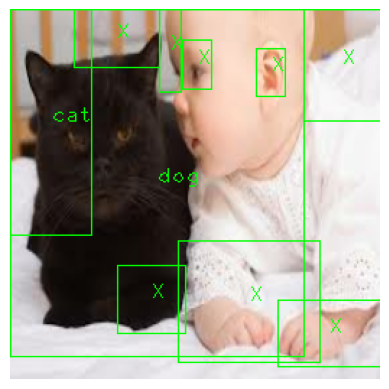

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


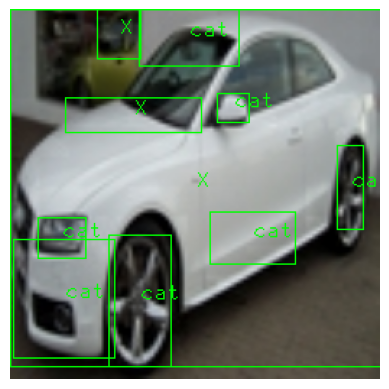

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


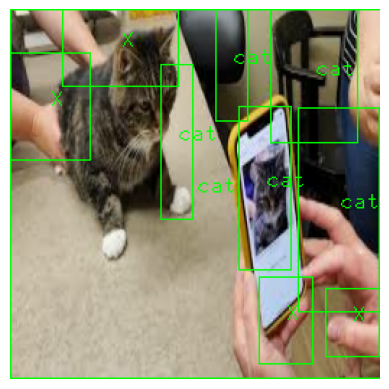

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


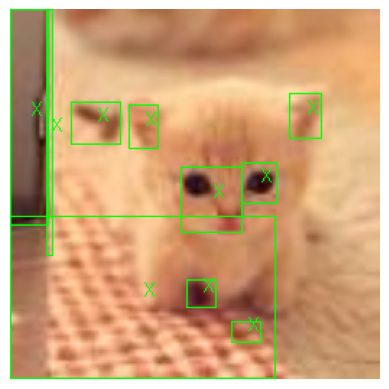

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


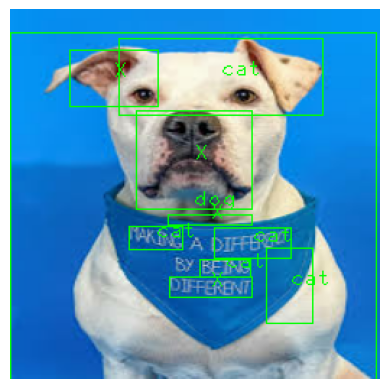

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


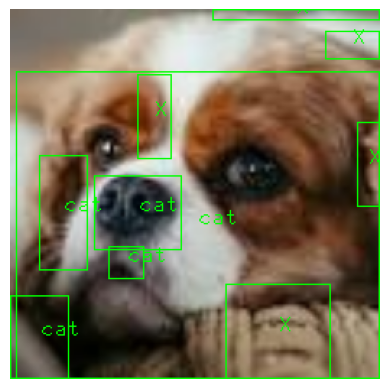

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


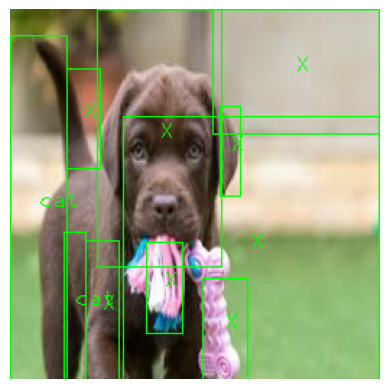

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


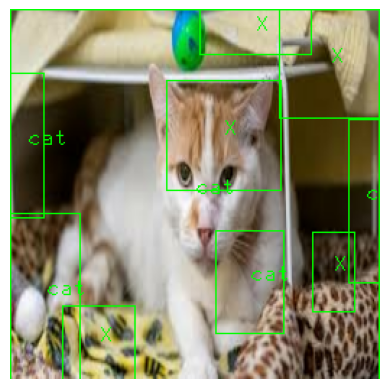

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


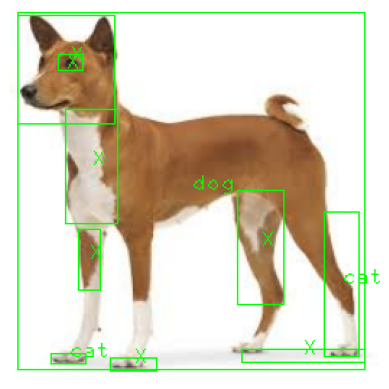

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


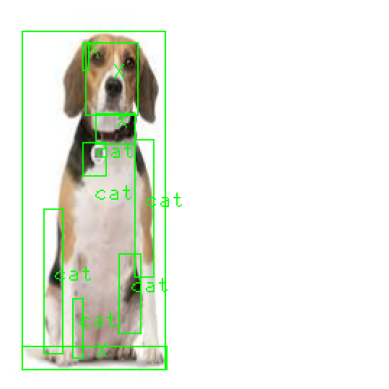

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


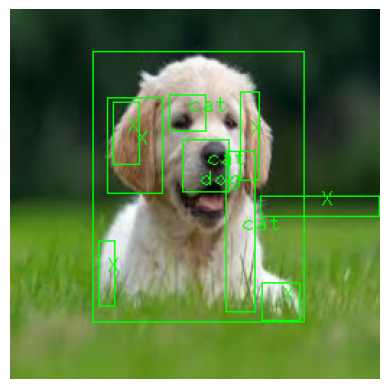

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


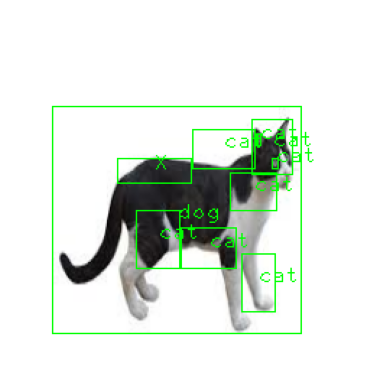

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


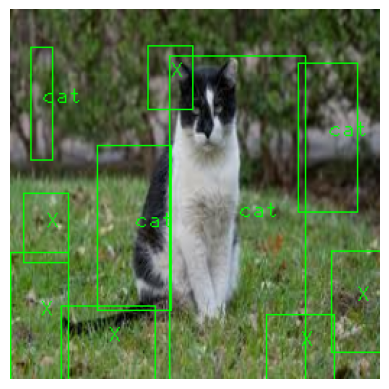

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


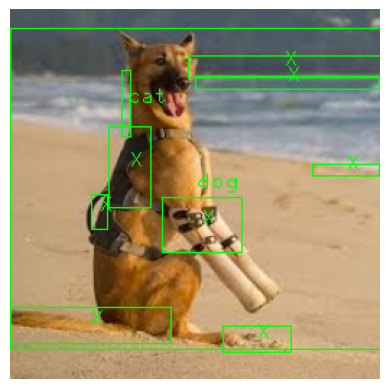

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


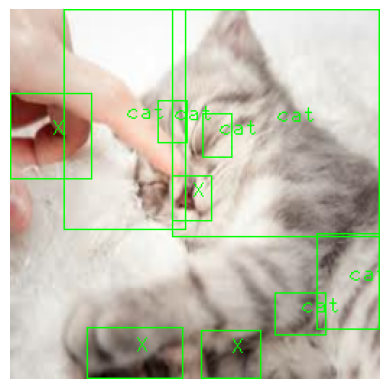

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


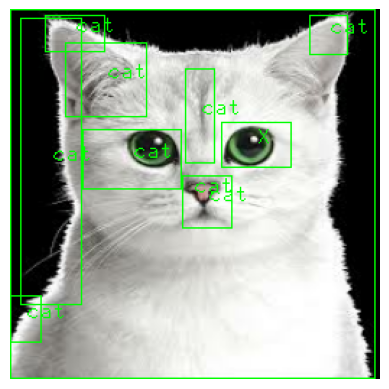

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


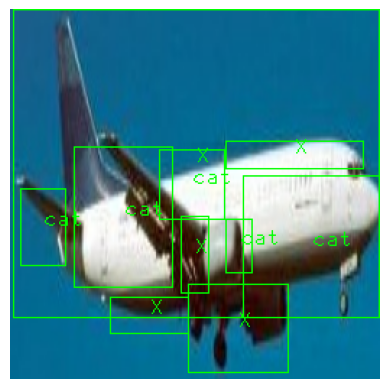

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


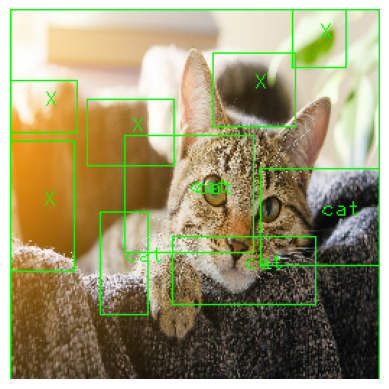

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


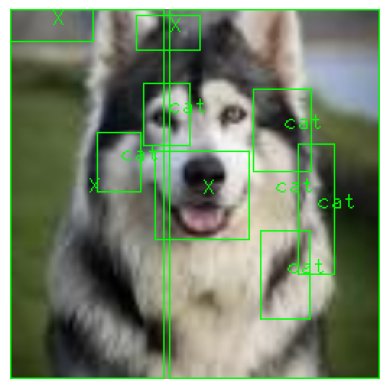

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


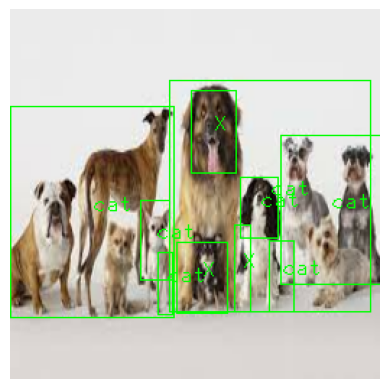

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


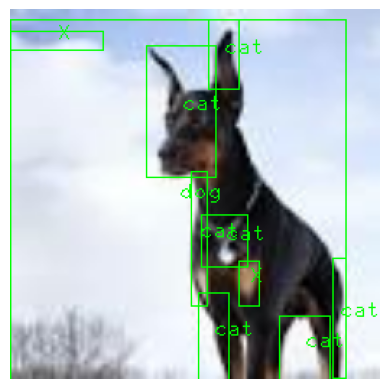

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


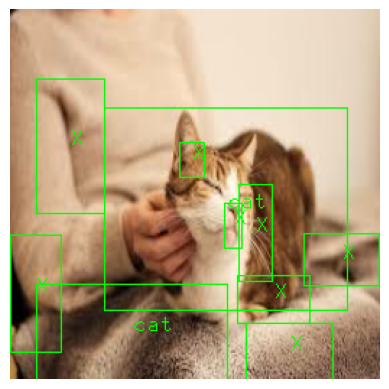

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


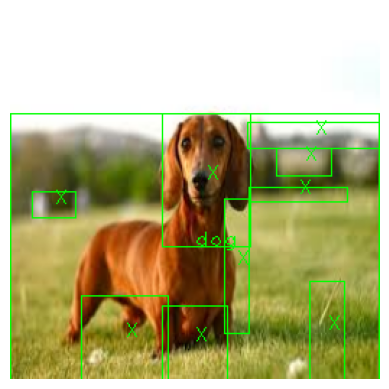

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


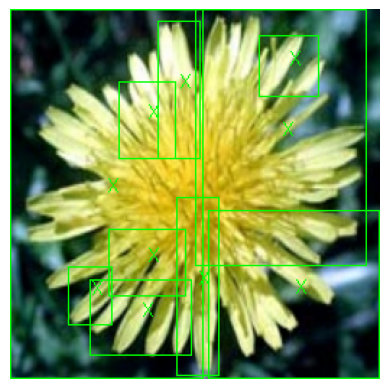

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


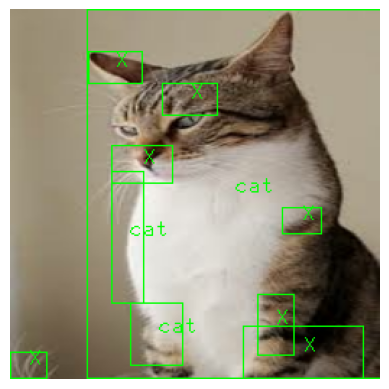

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


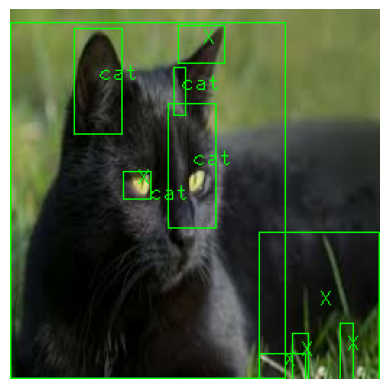

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


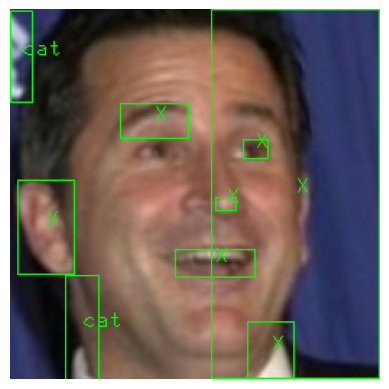

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


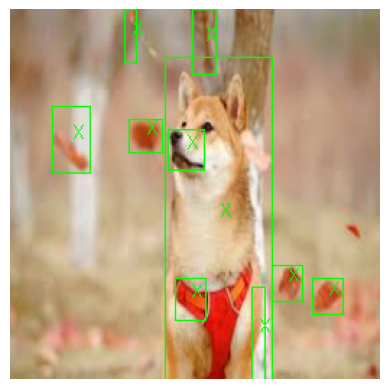

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


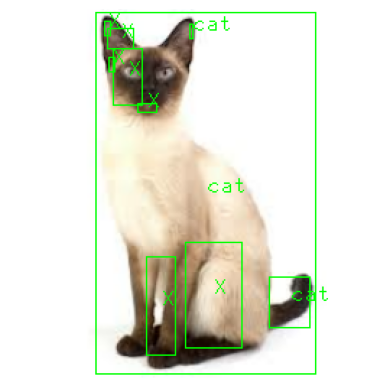

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


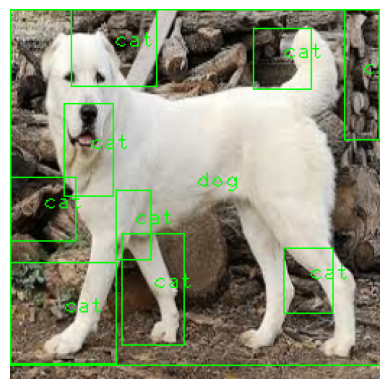

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


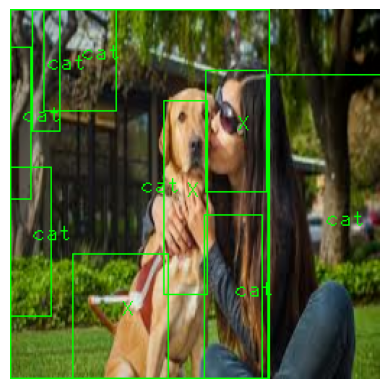

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


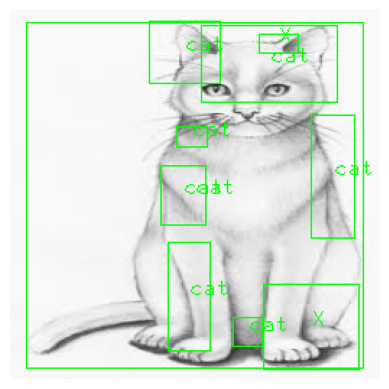

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


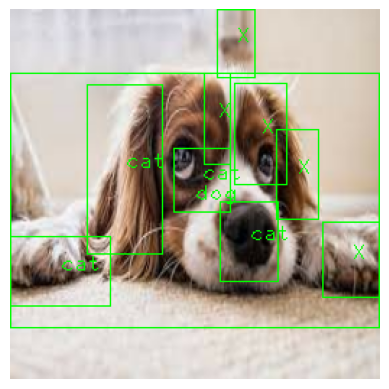

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


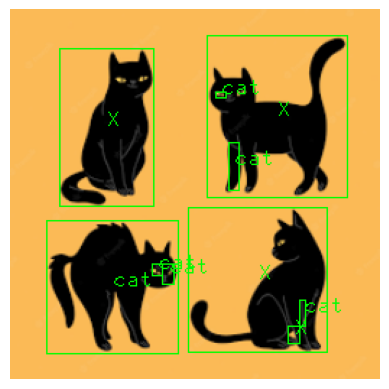

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


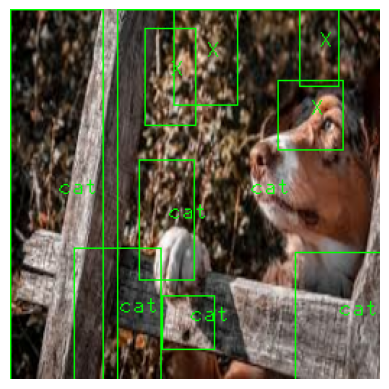

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


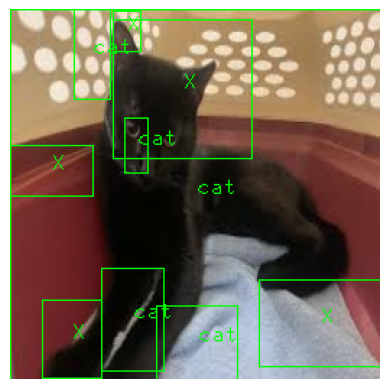

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


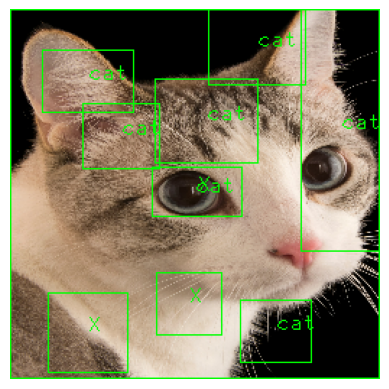

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


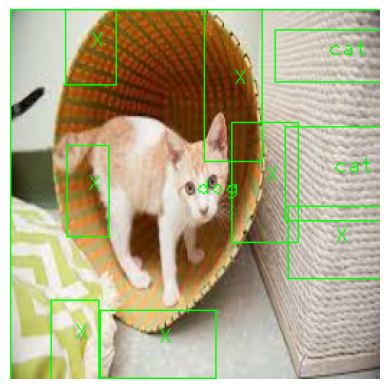

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


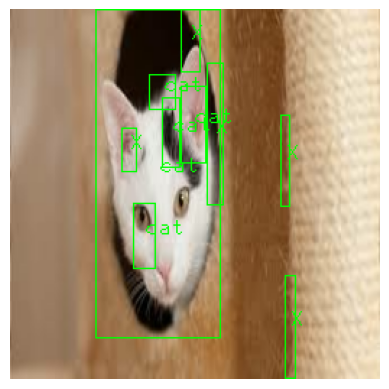

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


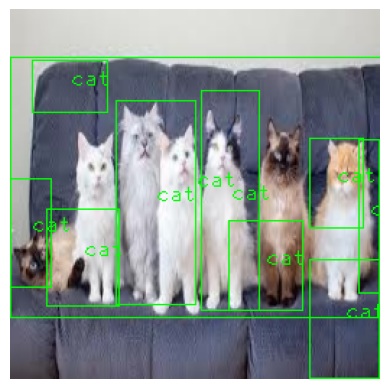

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


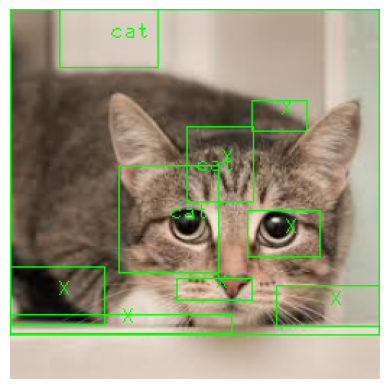

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


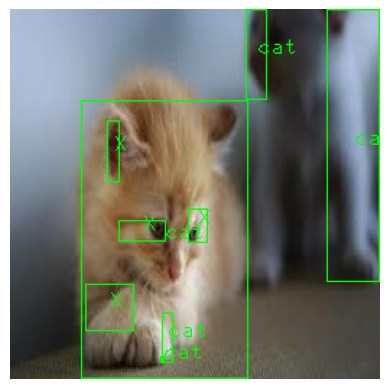

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


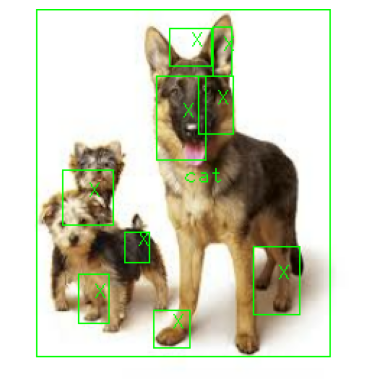

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


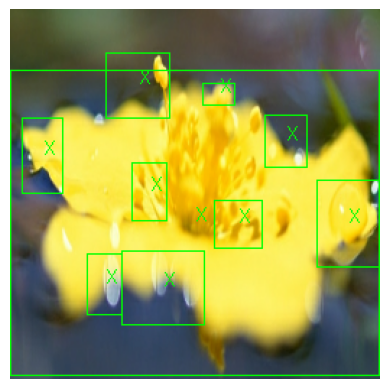

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


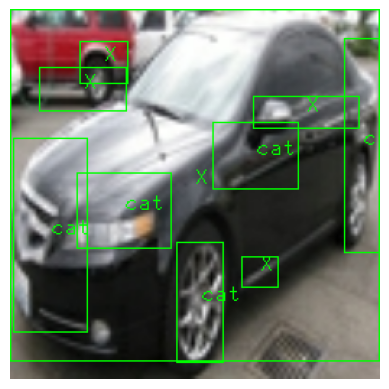

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


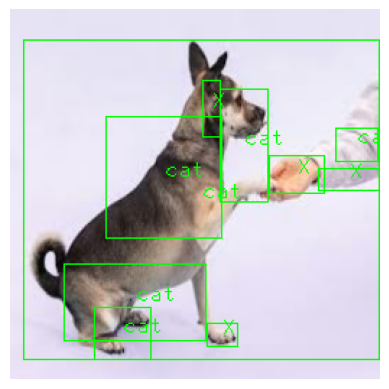

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


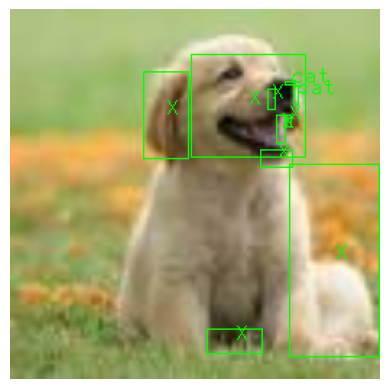

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


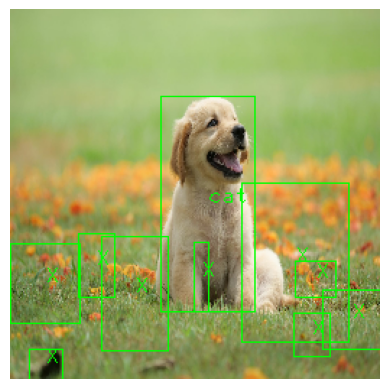

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


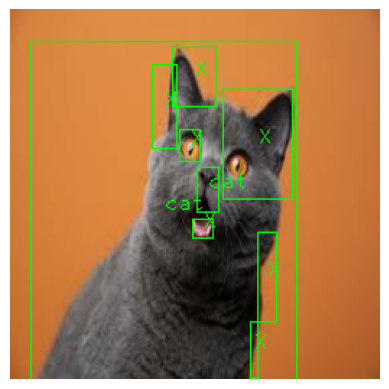

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


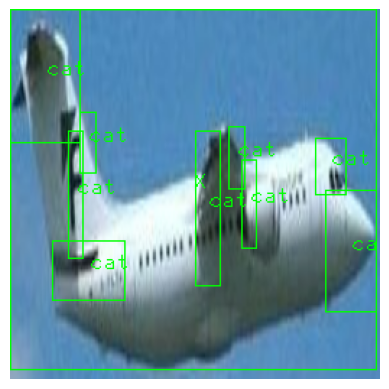

In [243]:
import selectivesearch
import random

random.shuffle(img_list)
class_names = ["cat", "dog", "X"]

for img_idx in range(0,50,1):
  # other data
  # img_path = img_list[img_idx]
  # img = cv2.imread(img_path)
  img = img_list[img_idx] # test_ds
  img = (img * 255).astype(np.uint8)
  _, regions = selectivesearch.selective_search(img, scale=600, min_size=100)
  region_rects = [cand['rect'] for cand in regions]

  bboxes = []
  for rect in region_rects:
      xmin = rect[0]
      ymin = rect[1]
      xmax = rect[0] + rect[2]
      ymax = rect[1] + rect[3]
      bboxes.append([xmin, ymin, xmax, ymax])

  img_h, img_w = img.shape[:2]

  filtered_boxes = []
  for box in bboxes:
      xmin, ymin, xmax, ymax = box
      w, h = xmax - xmin, ymax - ymin
      if  w < 0.95 * img_w and h < 0.95 * img_h:
          filtered_boxes.append([xmin, ymin, xmax, ymax])

  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  edges = cv2.Canny(gray, threshold1=50, threshold2=300, apertureSize=3)
  kernel = np.ones((3,3), np.uint8)
  contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  edge_boxes = []
  img_h, img_w = img.shape[:2]
  for contour in contours:
      x, y, w, h = cv2.boundingRect(contour)
      if  w < 0.95 * img_w and h < 0.95 * img_h:
        edge_boxes.append([x, y, x+w, y+h])


  combined_boxes = filtered_boxes + edge_boxes
  optimized_bboxes = optimize_bboxes(combined_boxes, iou_threshold=0.05)
  optimized_bboxes = optimized_bboxes[:10]



  test_img = []
  final_boxes = []
  for box in optimized_bboxes:
      xmin, ymin, xmax, ymax = box
      cropped_img = img[ymin:ymax, xmin:xmax]
      if cropped_img.size == 0:  # 예외 처리: 빈 이미지 방지
          continue
      cropped_img = cv2.copyMakeBorder(cropped_img, 5,5,5,5, cv2.BORDER_CONSTANT, value=[0,0,0])
      warped_img = cv2.resize(cropped_img, (256,256), interpolation=cv2.INTER_LINEAR)
      #warped_img = cv2.resize(cropped_img, (256, 256), interpolation=cv2.INTER_LINEAR)
      test_img.append(warped_img)
      final_boxes.append(box)  # 유효한 박스만 남김

  if not test_img:
      continue  # 유효한 crop이 없으면 넘어감

  test_img = np.array(test_img)  # (N, 256, 256, 3)
  test_img = test_img.astype('float32') / 255.0  # 정규화 (모델에 따라 필요)

  # 2. 예측
  y_pred = CNN_model.predict(test_img)
  y_pred = np.argmax(y_pred, axis=1)  # 클래스 번호 추출


  temp_img = img.copy()
  # for i, box in enumerate(edge_boxes):
  #     xmin, ymin, xmax, ymax = box
  #     cv2.rectangle(temp_img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 1)

  # for i, box in enumerate(filtered_boxes):
  #     xmin, ymin, xmax, ymax = box
  #     cv2.rectangle(temp_img, (xmin, ymin), (xmax, ymax), (0, 0, 255), 1)


  # 3. 결과 시각화
  #temp_img = img.copy()
  for i, box in enumerate(final_boxes):
      xmin, ymin, xmax, ymax = box
      label = class_names[y_pred[i]]
      cv2.rectangle(temp_img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 1)
      half_x= int((xmax-xmin)*0.5)
      half_y= int((ymax-ymin)*0.5)
      cv2.putText(temp_img, label, (xmin+half_x, ymin+half_y), 1, 1, (0, 255, 0), 1)

  # temp_img_rgb = cv2.cvtColor(temp_img, cv2.COLOR_BGR2RGB)
  # plt.imshow(temp_img_rgb)
  plt.imshow(temp_img)
  plt.axis('off')
  plt.show()

